In [1]:
#cały zbiór
#brak dzielenia na 50 próbek z jednego wiersza - scalanie postów
#bez usuwania wierszy jeśli mają poniżej 50 postów
#podział następuje dopiero po preprocessingu

#uzupełnienie zbioru?

In [1]:
import tensorflow as tf
print(tf.config.list_physical_devices('GPU'))

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


### Import bibliotek

In [2]:
import random
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import nltk
#from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.tokenize import TweetTokenizer
import re

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

### Zbiór danych

Pochodzi z platformy Kaggle: https://www.kaggle.com/datasets/datasnaek/mbti-type .

In [3]:
#każdy rząd składa się z typu osobowości i 50 ostatnich postów
df = pd.read_csv('mbti_1.csv', sep=',')
df.head()

,type,posts
0,INFJ,'http://www.youtube.com/watch?v=qsXHcwe3krw|||...
1,ENTP,'I'm finding the lack of me in these posts ver...
2,INTP,'Good one _____ https://www.youtube.com/wat...
3,INTJ,"'Dear INTP, I enjoyed our conversation the o..."
4,ENTJ,'You're fired.|||That's another silly misconce...


In [4]:
df.shape

(8675, 2)

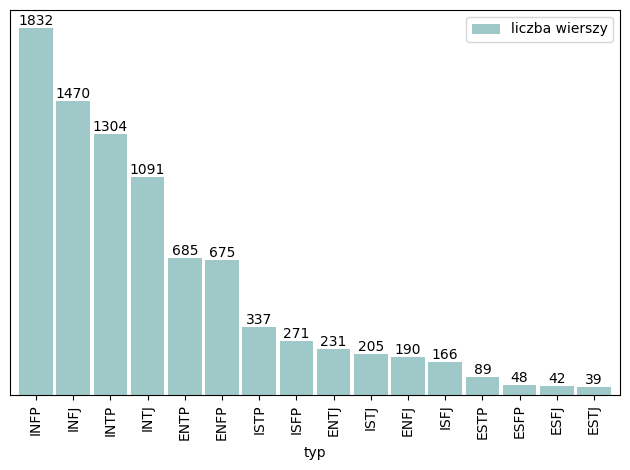

In [5]:
#podstawowy zbiór danych - dystrybucja postów między typami
#https://www.simplifiedsciencepublishing.com/resources/best-color-palettes-for-scientific-figures-and-data-visualizations

ax = df.groupby('type').count().sort_values(by='posts', ascending=False).plot.bar(width=0.9, color='#9fc8c8')
ax.bar_label(ax.containers[0])[1]
ax.legend(["liczba wierszy"])
ax.set_xlabel("typ")
ax.yaxis.set_visible(False)
ax.figure.tight_layout()
ax.figure.savefig('distribution.png')

In [6]:
#16 typów osobowości - nazwy klas
types = df.type.unique().tolist()
print(types)

#dodanie kolumny z klasami wyrażonymi liczbami (0 - 15)
df['class_no'] = df.apply(lambda x: types.index(x['type']), axis=1)

df

['INFJ', 'ENTP', 'INTP', 'INTJ', 'ENTJ', 'ENFJ', 'INFP', 'ENFP', 'ISFP', 'ISTP', 'ISFJ', 'ISTJ', 'ESTP', 'ESFP', 'ESTJ', 'ESFJ']


,type,posts,class_no
0,INFJ,'http://www.youtube.com/watch?v=qsXHcwe3krw|||...,0
1,ENTP,'I'm finding the lack of me in these posts ver...,1
2,INTP,'Good one _____ https://www.youtube.com/wat...,2
3,INTJ,"'Dear INTP, I enjoyed our conversation the o...",3
4,ENTJ,'You're fired.|||That's another silly misconce...,4
...,...,...,...
8670,ISFP,'https://www.youtube.com/watch?v=t8edHB_h908||...,8
8671,ENFP,'So...if this thread already exists someplace ...,7
8672,INTP,'So many questions when i do these things. I ...,2
8673,INFP,'I am very conflicted right now when it comes ...,6


In [7]:
#słownik odkodowujący
idx_to_type = {}
for i, t in enumerate(types): idx_to_type[i] = t

idx_to_type

{0: 'INFJ',
 1: 'ENTP',
 2: 'INTP',
 3: 'INTJ',
 4: 'ENTJ',
 5: 'ENFJ',
 6: 'INFP',
 7: 'ENFP',
 8: 'ISFP',
 9: 'ISTP',
 10: 'ISFJ',
 11: 'ISTJ',
 12: 'ESTP',
 13: 'ESFP',
 14: 'ESTJ',
 15: 'ESFJ'}

In [8]:
df['posts'][2]

"'Good one  _____   https://www.youtube.com/watch?v=fHiGbolFFGw|||Of course, to which I say I know; that's my blessing and my curse.|||Does being absolutely positive that you and your best friend could be an amazing couple count? If so, than yes.   Or it's more I could be madly in love in case I reconciled my feelings (which at...|||No, I didn't; thank you for a link!|||So-called Ti-Si loop (and it can stem from any current topic/obsession) can be deadly. It's like when you're stuck in your own thoughts, and your mind just wanders in circles. Feels truly terrible. ...|||Have you noticed how peculiar vegetation can be? All you have to do is look down at the grass: dozens of different plant species there.    And now imagine that hundreds of years later (when/if soil...|||The Smiths – Never Had No One Ever|||I often find myself spotting faces on marble tiles/wood.|||This 5 year-old sentence is an incredibly accurate and beautiful description.|||I haven't visited this website in the last 3

In [9]:
#zamiana separatora postów na zwykłą spację
df['posts_merged'] = df['posts'].str.replace(pat = '|||', repl = ' ')

In [10]:
df['posts_merged'][2]

"'Good one  _____   https://www.youtube.com/watch?v=fHiGbolFFGw Of course, to which I say I know; that's my blessing and my curse. Does being absolutely positive that you and your best friend could be an amazing couple count? If so, than yes.   Or it's more I could be madly in love in case I reconciled my feelings (which at... No, I didn't; thank you for a link! So-called Ti-Si loop (and it can stem from any current topic/obsession) can be deadly. It's like when you're stuck in your own thoughts, and your mind just wanders in circles. Feels truly terrible. ... Have you noticed how peculiar vegetation can be? All you have to do is look down at the grass: dozens of different plant species there.    And now imagine that hundreds of years later (when/if soil... The Smiths – Never Had No One Ever I often find myself spotting faces on marble tiles/wood. This 5 year-old sentence is an incredibly accurate and beautiful description. I haven't visited this website in the last 3 years. So whoever

### Rozpakowanie postów

Każdy z wierszy zawiera wewnątrz 50 postów. Nie rozdzielamy ich, są już złączone w jeden długi tekst.

In [11]:
#usunięcie rozdzielonej kolumny
df = df.drop(columns = ['posts'])

In [12]:
df.dtypes

type            object
class_no         int64
posts_merged    object
dtype: object

In [13]:
#zmiana typów zmiennych
df = df.astype({'type':'string', 'posts_merged':'string'})

In [14]:
df.head()

,type,class_no,posts_merged
0,INFJ,0,'http://www.youtube.com/watch?v=qsXHcwe3krw ht...
1,ENTP,1,'I'm finding the lack of me in these posts ver...
2,INTP,2,'Good one _____ https://www.youtube.com/wat...
3,INTJ,3,"'Dear INTP, I enjoyed our conversation the o..."
4,ENTJ,4,'You're fired. That's another silly misconcept...


### Czyszczenie tekstu i ekstrakcja cech

Tokenizacja

In [15]:
#zmiejszenie liter i rozdzielenie ciągów znaków na listy słów/cząstek
# df_test['post_words'] = df_test.apply(lambda x: word_tokenize(x['post'].lower()), axis=1)
# df_train['post_words'] = df_train.apply(lambda x: word_tokenize(x['post'].lower()), axis=1)

#zmiejszenie liter i rozdzielenie ciągów znaków na listy słów/cząstek - ten tokenizer nie rozdziela na "he" + "'s" i zachowuje całe emotki oraz hashtagi
tweet_tokenizer = TweetTokenizer()
df['post_words'] = df.apply(lambda x: tweet_tokenizer.tokenize(x['posts_merged'].lower()), axis=1)

Słowa bez znaczenia

In [16]:
#usuwanie słów bez znaczenia ('stopwords')
nltk.download('stopwords')

#wszystkie są pisane małymi literami
#uwaga - usunięte będą zarówno słowa "have/has" jak i skrócone wersje "i've/he's" - jeśli typy osobowości znajdują rozróżnienie na tym polu to badanie będzie ograniczone
stopwords.words('english')[:15], stopwords.words('english')[-15:]

#co istotne - zbiór zawiera zarówno wersje słów "w całości" jak i "w częściach" (dowolność tokenizacji): ‘won’, ‘t’, “won’t”
#nie zawiera cząstek, które otrzymamy używając word_tokenize biblioteki NLTK - "'s"

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\marta\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


(['i',
  'me',
  'my',
  'myself',
  'we',
  'our',
  'ours',
  'ourselves',
  'you',
  "you're",
  "you've",
  "you'll",
  "you'd",
  'your',
  'yours'],
 ["mustn't",
  'needn',
  "needn't",
  'shan',
  "shan't",
  'shouldn',
  "shouldn't",
  'wasn',
  "wasn't",
  'weren',
  "weren't",
  'won',
  "won't",
  'wouldn',
  "wouldn't"])

In [17]:
#jednoliterowe słowa bez znaczenia
for word in stopwords.words('english'):
    if len(word) == 1:
        print(word)

i
a
s
t
d
m
o
y


In [18]:
stop_set = set(stopwords.words('english'))

#problem
"i'm" in stop_set, "i've" in stop_set, "i" in stop_set, "have" in stop_set, "am" in stop_set, "im" in stop_set, "m" in stop_set, "'m" in stop_set
#należy rozdzielić słowa z uwzględnieniem apostrofów

(False, False, True, True, True, False, True, False)

In [19]:
df.post_words

0       [', http://www.youtube.com/watch?v=qsxhcwe3krw...
1       [', i'm, finding, the, lack, of, me, in, these...
2       [', good, one, ___, https://www.youtube.com/wa...
3       [', dear, intp, ,, i, enjoyed, our, conversati...
4       [', you're, fired, ., that's, another, silly, ...
                              ...                        
8670    [', https://www.youtube.com/watch?v=t8edhb_h90...
8671    [', so, ..., if, this, thread, already, exists...
8672    [', so, many, questions, when, i, do, these, t...
8673    [', i, am, very, conflicted, right, now, when,...
8674    [', it, has, been, too, long, since, i, have, ...
Name: post_words, Length: 8675, dtype: object

In [20]:
df['post_split'] = df.apply(lambda x: [word.split("'") for word in x.post_words], axis=1)

In [21]:
df.post_split

0       [[, ], [http://www.youtube.com/watch?v=qsxhcwe...
1       [[, ], [i, m], [finding], [the], [lack], [of],...
2       [[, ], [good], [one], [___], [https://www.yout...
3       [[, ], [dear], [intp], [,], [i], [enjoyed], [o...
4       [[, ], [you, re], [fired], [.], [that, s], [an...
                              ...                        
8670    [[, ], [https://www.youtube.com/watch?v=t8edhb...
8671    [[, ], [so], [...], [if], [this], [thread], [a...
8672    [[, ], [so], [many], [questions], [when], [i],...
8673    [[, ], [i], [am], [very], [conflicted], [right...
8674    [[, ], [it], [has], [been], [too], [long], [si...
Name: post_split, Length: 8675, dtype: object

In [22]:
#spłaszczanie list

df['post_flatten'] = df.apply(lambda x: [word for sublist in x.post_split for word in sublist], axis=1)

In [23]:
df.post_flatten

0       [, , http://www.youtube.com/watch?v=qsxhcwe3kr...
1       [, , i, m, finding, the, lack, of, me, in, the...
2       [, , good, one, ___, https://www.youtube.com/w...
3       [, , dear, intp, ,, i, enjoyed, our, conversat...
4       [, , you, re, fired, ., that, s, another, sill...
                              ...                        
8670    [, , https://www.youtube.com/watch?v=t8edhb_h9...
8671    [, , so, ..., if, this, thread, already, exist...
8672    [, , so, many, questions, when, i, do, these, ...
8673    [, , i, am, very, conflicted, right, now, when...
8674    [, , it, has, been, too, long, since, i, have,...
Name: post_flatten, Length: 8675, dtype: object

In [24]:
#usuwanie słów bez znaczenia
df['post_no_stopwords'] = df.apply(lambda x: [word for word in x.post_flatten if word not in stop_set], axis=1)

In [25]:
df.columns

Index(['type', 'class_no', 'posts_merged', 'post_words', 'post_split',
       'post_flatten', 'post_no_stopwords'],
      dtype='object')

In [26]:
print(df.iloc[2, 2]) #oryginał
print(df.iloc[2, 3]) #zmniejszenie liter i tokenizacja
print(df.iloc[2, 5]) #rozdzielenie względem apostrofu
print(df.iloc[2, 6]) #słowa bez znaczenia usunięte

'Good one  _____   https://www.youtube.com/watch?v=fHiGbolFFGw Of course, to which I say I know; that's my blessing and my curse. Does being absolutely positive that you and your best friend could be an amazing couple count? If so, than yes.   Or it's more I could be madly in love in case I reconciled my feelings (which at... No, I didn't; thank you for a link! So-called Ti-Si loop (and it can stem from any current topic/obsession) can be deadly. It's like when you're stuck in your own thoughts, and your mind just wanders in circles. Feels truly terrible. ... Have you noticed how peculiar vegetation can be? All you have to do is look down at the grass: dozens of different plant species there.    And now imagine that hundreds of years later (when/if soil... The Smiths – Never Had No One Ever I often find myself spotting faces on marble tiles/wood. This 5 year-old sentence is an incredibly accurate and beautiful description. I haven't visited this website in the last 3 years. So whoever 

Linki

In [27]:
#zamiana linków na słowo kluczowe
def replace_URL(str):
    return re.sub(r"http\S+", "[LINK]", str)

df['post_links'] = df.apply(lambda x: [replace_URL(word) for word in x.post_no_stopwords], axis=1)

In [28]:
#sprawdzenie linków
only_link = 0
for index, row in df.iterrows():
    if "[LINK]" in row["post_links"]:
        #print(row["post_no_stopwords"], row["post_links"])
        if row["post_links"] == ['[LINK]']: only_link += 1
print("Ramka zawiera", only_link, "postów zawierających jedynie jeden link (na", df.shape[0],"postów).")

Ramka zawiera 0 postów zawierających jedynie jeden link (na 8675 postów).


Emotki

In [29]:
#szukanie emotek (nie zawierających liczb!)

for index, row in df.iterrows():
    for r in row["post_links"]:
        if(re.search(r"\A[^\sa-zA-Z0-9_.]{2,}\Z", r)):
           if r != "...": print(r)

=/
:)
:)
:)
:)
:)
):
:)
:)
:)
:)
:)
:)
:)
=/
;)
=/
:)
:)
:)
;)
:)
:)
:)
:)
:)
:)
<---
:)
--->
:)
;)
:)
:)
:)
;)
:)
:)
):
::
::
::
::
:(
:)
:)
:)
:)
:)
:)
:)
:)
:)
:)
:)
:)
:)
:)
:)
:)
;)
:)
:)
;)
:)
:)
:)
:)
:)
:)
:)
:)
:)
:)
:(
:)
:)
:(
:)
:)
:(
;)
;)
;)
:)
:)
;)
:)
:)
:)
:)
:)
:)
:)
:)
:)
:)
:)
:(
:/
:/
:)
:)
:)
:(
:(
:)
:)
:)
:)
:)
:)
:)
:)
:)
:)
:)
:)
;)
:(
;)
->
):
:)
:)
:)
:)
;)
:)
:)
:)
;)
:)
;)
:)
:)
:)
:)
=/
:/
:)
:(
:(
;)
:)
:)
:)
:)
):
:)
:)
:)
::
::
;)
:)
:)
:)
:(
:)
:)
:)
):
::
::
::
:)
;)
:)
::
::
::
::
:/
::
(:
(:
(:
(:
(:
(:
(:
(:
);
(:
(:
(:
(:
:)
(:
:)
;)
:)
:)
:)
:)
:/
):
:)
:)
):
:)
:)
:)
:)
:)
:)
:)
:)
:)
:)
;)
:/
:)
:/
:/
:)
:)
:)
:)
:)
):
:)
<-
::
::
::
::
:)
:(
:)
:(
):
:)
:)
:)
:)
;)
;)
):
):
:)
):
:)
:)
:)
:)
:)
:)
:)
:)
:)
:/
:)
:(
:/
:)
:)
:)
:)
:)
:)
:)
:)
:/
):
:)
:)
[:
::
::
::
::
::
:]
<---
(:
:(
(:
:)
:)
:)
:)
:)
:)
:)
:)
:)
:)
:)
:)
:)
:)
):
=)
=)
=)
=)
=)
:)
:/
::
:)
:)
:)
:)
:)
:)
:)
;)
::
::
::
:)
::
::
::
::
::
::
:)
:)
:)
:)
:)
:)
:)
:)
:)
:)
:)
:

In [30]:
#zamiana powszechnych emoji na słowo kluczowe (emotki bez liczb + emotka serce)

def delete_foreign_emoji(str):
    return re.sub(r"사랑", "", str)

def replace_emojis(str):
    str = re.sub(r"\A[^\sa-zA-Z0-9_.]{2,}\Z", "[EMOJI]", str)
    str = re.sub(r"\A[:;][pd]\Z", "[EMOJI]", str)
    str = re.sub(r"<3", "[EMOJI]", str)
    str = re.sub(r"❤", "[EMOJI]", str)
    return str

df['post_emojis'] = df.apply(lambda x: [replace_emojis(delete_foreign_emoji(word)) for word in x.post_links], axis=1)

Interpunkcja

In [31]:
#flagowanie istotnych znaków interpunkcyjnych (kropek, wielokropka, wykrzykników, pytajników, bo mogą być znaczące dla analizy)
def replace_punctuation(str):
    str = re.sub(r"\A\.\.\.\Z", "[ELLIPSIS]", str)
    str = re.sub(r"\A\?\Z", "[QUESTION_MARK]", str)
    str = re.sub(r"\A!\Z", "[EXCLAMATION_MARK]", str)
    str = re.sub(r"\A\.\Z", "[PERIOD]", str)
    return str

df['post_punctuation_flags'] = df.apply(lambda x: [replace_punctuation(word) for word in x.post_emojis], axis=1)

In [32]:
df.columns

Index(['type', 'class_no', 'posts_merged', 'post_words', 'post_split',
       'post_flatten', 'post_no_stopwords', 'post_links', 'post_emojis',
       'post_punctuation_flags'],
      dtype='object')

In [33]:
print(df.iloc[10,8])
print(df.iloc[10,9])

['', '', 'one', 'time', 'parents', 'fighting', 'dad', 'affair', 'dad', 'pushed', 'mom', '.', 'fall', 'broke', 'finger', '.', 'pointed', 'gun', 'made', 'get', 'knees', 'beg', 'life', '.', '...', 'gonna', 'talk', 'piece', 'shit', 'dad', '.', 'alcoholic', 'kind', 'serious', 'mental', 'problem', 'comes', 'complying', 'irs', '.', '(', 'words', ',', 'laws', 'apply', '...', 'omg', '...', 'women', 'center', 'lived', ',', 'run', 'catholic', 'charity', ',', 'fat', 'bully', 'program', 'manager', 'took', 'upon', 'change', 'policy', 'tenants', 'forced', 'attend', 'christmas', 'party', '.', '...', 'work', ',', 'calling', '100', '%', 'committed', '24/7', 'vacation', 'days', 'ever', '.', 'kundalini', 'mystic', '.', 'oh', ',', 'get', 'paid', ',', 'either', '!', 'one', 'destined', 'things', '...', 'art', 'teacher', 'high', 'school', 'stack', 'art', 'school', 'catalogs', '.', 'saw', 'one', 'school', 'ended', 'going', ',', 'immediately', 'knew', 'one', '.', 'without', 'research', '.', 'like', '...', 'infj

In [34]:
#szukanie przypadkowych i nieznaczących zbiorów znaków
for index, row in df.iterrows():
    for r in row["post_punctuation_flags"]:
        if(re.search(r"\A[^a-zA-Z0-9]+\Z", r)):
            if r not in ["[LINK]", "[EMOJI]", "[ELLIPSIS]", "[QUESTION_MARK]", "[EXCLAMATION_MARK]", "[PERIOD]"]:
                print(r)

~
,
,
,
(
)
,
(
(
)
,
,
,
:
:
,
:
:
:
:
/
,
,
,
. ...
,
,
)
)
,
)
,
:
,
*
*
+
,
,
,
/
,
,
;
/
/
;
:
;
(
:
=
;
,
,
,
,
*
*
,
(
)
,
;
,
,
,
>
>
<
<
,
:
:
(
+
)
___
,
;
,
(
,
;
(
/
)
,
. ...
:
(
/
–
/
(
,
,
(
)
-
..
-
:
-
,
,
-
-
,
,
-
(
..
;
,
-
..
,
;
,
(
)
,
/
,
..
,
(
)
,
)
)
)
,
,
,
;
,
,
,
,
(
,
,
-
(
,
)
,
,
:
,
,
,
,
,
,
,
,
,
%
,
,
,
,
-
[
]
,
,
,
,
,
,
,
,
,
,
,
,
,
:
:
,
:
,
,
/
=
,
,
(
,
,
,
,
,
,
,
,
,
,
,
,
,
(
)
,
(
)
%
,
,
,
,
,
,
,
,
,
,
,
,
,
,
,
,
/
,
,
:
:
:
<
:
,
:
,
-
:
:
-
,
,
,
,
,
,
,
,
,
,
,
/
=
,
,
,
,
,
-
@
@
,
-
(
)
..
,
,
,
,
,
-
,
,
(
)
-
,
,
,
,
,
,
,
,
,
,
,
;
,
;
,
<
(
)
,
,
,
,
,
,
,
;
;
,
-
(
)
,
;
,
,
,
;
(
,
,
,
,
,
,
+
+
,
,
,
(
/
)
(
&
)
/
(
&
)
-
(
)
,
,
,
:
,
,
,
,
,
(
)
,
(
)
,
,
,
-
,
,
,
(
)
,
.  ...
,
,
(
,
(
)
,
,
:
,
-
-
-
-
(
)
-
-
,
,
,
(
)
,
,
,
:
-
,
,
:
:
*
*
,
,
,
？
,
-
-
,
,
,
,
,
,
:
,
:
:
,
,
,
,
-
,
:
:
,
,
,
:
:
,
,
,
(
)
:
:
,
-
,
,
,
,
-
,
,
,
,
-
-
-
:
-
(
<
,
,
,
>
)
<
,
:
:
:
,
/
,
,
,
:
,
(
,
,
,
)
:
(
)
:
:
,
,
,
:
:
,
:
,


In [35]:
#usuwanie przypadkowych i nieznaczących zbiorów znaków
def delete_punctuation(str):
    if(re.search(r"\A[^a-zA-Z0-9]+\Z", str)):
        if str not in ["[LINK]", "[EMOJI]", "[ELLIPSIS]", "[QUESTION_MARK]", "[EXCLAMATION_MARK]", "[PERIOD]"]:
            str = re.sub(r"\A[^a-zA-Z0-9_]+\Z", "", str)
    return str

df['post_punctuation_cleaned'] = df.apply(lambda x: [delete_punctuation(word) for word in x.post_punctuation_flags], axis=1)

In [36]:
print(df.iloc[1,9])
print(df.iloc[1,10])

['', '', 'finding', 'lack', 'posts', 'alarming', '[PERIOD]', 'sex', 'boring', 'position', 'often', '[PERIOD]', 'example', 'girlfriend', 'currently', 'environment', 'creatively', 'use', 'cowgirl', 'missionary', '[PERIOD]', 'enough', '[ELLIPSIS]', 'giving', 'new', 'meaning', '', '', 'game', '', '', 'theory', '[PERIOD]', 'hello', '*', 'entp', 'grin', '*', 'takes', '[PERIOD]', 'converse', 'flirting', 'acknowledge', 'presence', 'return', 'words', 'smooth', 'wordplay', 'cheeky', 'grins', '[PERIOD]', '+', 'lack', 'balance', 'hand', 'eye', 'coordination', '[PERIOD]', 'real', 'iq', 'test', 'score', '127', '[PERIOD]', 'internet', 'iq', 'tests', 'funny', '[PERIOD]', 'score', '140s', 'higher', '[PERIOD]', ',', 'like', 'former', 'responses', 'thread', 'mention', 'believe', 'iq', 'test', '[PERIOD]', 'banish', '[ELLIPSIS]', 'know', 'entp', 'vanish', 'site', 'year', 'half', ',', 'return', ',', 'find', 'people', 'still', 'commenting', 'posts', 'liking', 'ideas', '/', 'thoughts', '[PERIOD]', 'know', 'en

Liczby

In [37]:
#szukanie liczb
for index, row in df.iterrows():
    for r in row["post_punctuation_cleaned"]:
        if(re.search(r"\A[0-9]+\Z", r)):
            print(r)

7
84389
84390
1
2
3
49142
127
4
24
5
3
57
34
90
357002
3
349890
256818
246386
97
236994
06
358
368
358
385
9
2
351
3
3
1
6
66314
1
1
2
8
2012
90
06
718314
20
30
20
2
3
78
94
1
2
651762
3
1
2
2
201011
70
35
15
1
2
1
3
629346
90
90
2
10
1
6
100
1
5
5
30
10
2
51
4
2
3
21
15
18
21
20
11
1
5
1
22
6
2
3
6
8
5
1
230346
1933
24
26
37
2
226530
101
9
5
1
30
4
3
2005
35
90
1
478
468
451
458
3
1
2
50
50
13
2
1960
9
5
10
100
7
1
1
2
3
15
85
147410
1934
85
1
1
3
21
91
16
26
16
20
45016
40386
9
4
9
6
8
3
8
2
79
58551
62984
1
2
3
12
13
90
10
30
6
117
5
0
15
3
4
5
10
3
4
5
10
15
5
0
4
10
15
5
0
15
4
5
5
0
15
5
36
35
1
2
3
4
543570
2
25
56
38
6
0
25
50
19
203786
5
1
2
10
2
20
1
2
594
459
2
2
2
10
100
15
16
99
3
90
5110
5110
1
1
93943
1
2
3
6
2
5
9
0
4
12
1
2
3
1
16
2
10
5
14
30
199738
11
488698
1
132001
1
1
2
19
75160
3
73757
50
1
1
1
2
4
5
95
89
1
30
300
2
3
2
1
2
3
1
20
3
425906
593
953
9
5
40
6
50
5
95
9
1
4
55
3
517682
1
6
6
1984
1
3
24
4
6
7
10
4
9
9
8
9
8
0
8
2
28
2
50
73
2
99
100
3
16
13
45
16
3


In [38]:
#flagowanie czystych liczb (ich dokładne wartości nie mają znaczenia, a poszerzą słownik)
def replace_numbers(str):
    return re.sub(r"\A[0-9]+\Z", "[NUMBER]", str)

df['post_numbers'] = df.apply(lambda x: [replace_numbers(word) for word in x.post_punctuation_cleaned], axis=1)

In [39]:
print(df.iloc[6,10])
print(df.iloc[6,11])

['', '', '', 'draw', 'nails', '', 'haha', '', '[PERIOD]', 'done', 'professionals', 'nails', '[PERIOD]', 'yes', '', 'gel', '[PERIOD]', 'mean', 'posted', 'done', 'nails', '[QUESTION_MARK]', 'awesome', '[EXCLAMATION_MARK]', 'probably', 'electronic', 'screen', 'syndrome', '[PERIOD]', 'advent', 'technology', 'social', 'media', '', 'suffer', 'overstimulation', 'daily', 'basis', '[PERIOD]', 'guilty', 'well', '[PERIOD]', 'past', '', 'happy', '[ELLIPSIS]', 'love', 'nail', 'arts', '[EXCLAMATION_MARK]', 'mine', '', '718282 7182', '90', '718298 7183', '06', '718314', 'first', 'time', 'hearing', '', 'menstruation', 'church', '[PERIOD]', 'thanks', 'sharing', 'yeah', '', 'crazy', '[PERIOD]', 'thought', 'taoists', 'belief', '[PERIOD]', 'dear', 'bad', 'person', '', 'trying', 'get', 'arguments', 'copying', 'sentence', 'future', 'use', '[PERIOD]', '', 'tongue', '', '', 'speaking', 'bomb', 'shelter', '', 'christian', 'values', 'still', 'hold', '[QUESTION_MARK]', 'agree', 'people', 'still', 'good', 'absenc

Hashtagi

In [40]:
for index, row in df.iterrows():
    for r in row["post_numbers"]:
        if(re.search(r"#", r)):
            print(r)

#happy
#inlove
#loveuallguys
#virginaf
#ldjam
#151616
#251617
#whynotcapitalizeyourwordstomakeiteasiertoread
#hashbrownselfie
#9001
#wastehistime
#13
##identity
#you
#noshame
#ilovethissite
#thisthreadisawesome
#thisisahashtag
#hashtagsareannoying
#1529
#doublepost
#maj
#fifty-eleven
#11
#asdforchatboxmod
#asdforchatboxmod2017
#confused
#againsttheflow
#ohdear
#infjlife
#fridaynightlife
#irony
#publicschool
#aecbd1
#eeeeee
#frostyforadmin
#redisthenewpurple
#yolo
#1t
#swoon
#holmes
#stevejobstep
#pessimism
#infpproblems
#number
#esfpproblems
#1
#37
#4
#idontthinkso
#27
#pretentious
#maga
#sarcasmbutpossibletrue
#storyofmylife
#vaan
#realrandomthought
#10
#kerrygoldgrassfedbutter
#toolazytoreadall20pages
#takepityonme
#cancelcolbert
#cancelcolbert
#wokeaf
#personalitycafe
#16
#ickyface
#667
#451
#91
#insta-ugly
#rewritethisthread
#nofilter
#swag
#hashtag
#talentalert
#neverforget
#neverforget
#psilocybin
#mckenna
#13
#16
#91
#thehardlife
#es
#rare
#based
#000000
#15
#icouldn
#holiday
#3

In [41]:
def replace_hashtags(str):
    return re.sub(r"#", "", str)

df['post_no_hashtags'] = df.apply(lambda x: [replace_hashtags(word) for word in x.post_numbers], axis=1)

Usuwanie pustych elementów

In [42]:
df['post_cleaned'] = df.apply(lambda x: list(filter(None, x.post_no_hashtags)), axis=1)

In [43]:
print(df.iloc[2, 12])
print(df.iloc[2, 13])

['', '', 'good', 'one', '___', '[LINK]', 'course', '', 'say', 'know', '', 'blessing', 'curse', '[PERIOD]', 'absolutely', 'positive', 'best', 'friend', 'could', 'amazing', 'couple', 'count', '[QUESTION_MARK]', '', 'yes', '[PERIOD]', 'could', 'madly', 'love', 'case', 'reconciled', 'feelings', '', '[ELLIPSIS]', '', '', 'thank', 'link', '[EXCLAMATION_MARK]', 'so-called', 'ti-si', 'loop', '', 'stem', 'current', 'topic', '', 'obsession', '', 'deadly', '[PERIOD]', 'like', 'stuck', 'thoughts', '', 'mind', 'wanders', 'circles', '[PERIOD]', 'feels', 'truly', 'terrible', '', 'noticed', 'peculiar', 'vegetation', '[QUESTION_MARK]', 'look', 'grass', '', 'dozens', 'different', 'plant', 'species', '[PERIOD]', 'imagine', 'hundreds', 'years', 'later', '', '', 'soil', '[ELLIPSIS]', 'smiths', '', 'never', 'one', 'ever', 'often', 'find', 'spotting', 'faces', 'marble', 'tiles', '', 'wood', '[PERIOD]', '[NUMBER]', 'year-old', 'sentence', 'incredibly', 'accurate', 'beautiful', 'description', '[PERIOD]', 'visi

In [44]:
df.shape

(8675, 14)

### Podział danych

In [45]:
from copy import deepcopy

#wycinki ramek danych (kopie głębokie) - jedynie wyczyszczone dane oraz numeryczne oznaczenia klas

print(df.columns)

df_cols = df[["type", "class_no", "post_cleaned"]].copy(deep=True)

Index(['type', 'class_no', 'posts_merged', 'post_words', 'post_split',
       'post_flatten', 'post_no_stopwords', 'post_links', 'post_emojis',
       'post_punctuation_flags', 'post_punctuation_cleaned', 'post_numbers',
       'post_no_hashtags', 'post_cleaned'],
      dtype='object')


In [46]:
df_cols.columns

Index(['type', 'class_no', 'post_cleaned'], dtype='object')

Ważne, aby posty jednej osoby nie znalazły się zarówno w zbiorze testowym jak i treningowym. W zbiorze testowym znajdzie się 20% wierszy każdego typu.

In [47]:
from sklearn.model_selection import train_test_split

# Split 80/20
df_train, df_test = train_test_split(df_cols, test_size=0.2, random_state=0, shuffle=True, stratify=df_cols.type)

In [48]:
tab = df_cols.loc[:, ['type', 'post_cleaned']].groupby('type').count()
tab2 = df_train.loc[:, ['type', 'post_cleaned']].groupby("type").count()
tab3 = df_test.loc[:, ['type', 'post_cleaned']].groupby("type").count()

tab.join(tab2, rsuffix="_train").join(tab3, rsuffix="_test")  #split review

,post_cleaned,post_cleaned_train,post_cleaned_test
type,,,
ENFJ,190,152,38
ENFP,675,540,135
ENTJ,231,185,46
ENTP,685,548,137
ESFJ,42,33,9
ESFP,48,38,10
ESTJ,39,31,8
ESTP,89,71,18
INFJ,1470,1176,294


### Modelowanie - BoW + TF-IDF

(array([1176.,  548., 1043.,  873.,  185.,  152., 1466.,  540.,  217.,
         270.,  133.,  164.,   71.,   38.,   31.,   33.]),
 array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.,
        13., 14., 15., 16.]),
 <BarContainer object of 16 artists>)

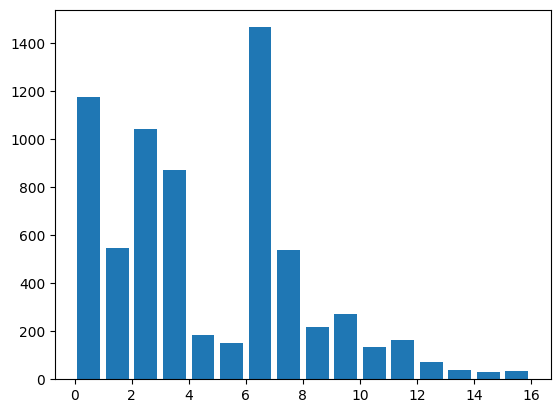

In [49]:
plt.hist(df_train.class_no, bins = list(range(0, 17)), rwidth = 0.8)

In [50]:
data_test_bow = df_test
data_train_bow = df_train

In [51]:
data_test_bow

,type,class_no,post_cleaned
3669,INTP,2,"[[NUMBER], tight, inbreeding, used, identify, ..."
2523,ENTP,1,"[absolutely, feel, home, stage, [PERIOD], prof..."
8117,INTP,2,"[indeed, [EXCLAMATION_MARK], critical-mass, am..."
180,ENTP,1,"[things, intelligent, persc, chatters, talk, [..."
7092,ISTJ,11,"[getting, along, entp, mostly, due, entp, show..."
...,...,...,...
1383,INTP,2,"[[NUMBER], average, female, scientist, also, c..."
2374,INFP,6,"[separate, rest, world, think, know, [PERIOD],..."
4422,ENFP,7,"[sure, [ELLIPSIS], throw, [NUMBER], cents, [PE..."
8335,INFP,6,"[[LINK], actually, listening, head, [ELLIPSIS]..."


In [52]:
#niepotrzebne po użyciu shuffle w train_test_split
# #przemieszanie bez seeda, ale w obrębie zbioru treningowego osobno, testowego osobno
# data_test_bow = data_test_bow.sample(frac = 1)
# data_train_bow = data_train_bow.sample(frac = 1)

In [53]:
data_test_bow['post_joined'] = data_test_bow.apply(lambda x: " ".join(x.post_cleaned), axis=1)
data_train_bow['post_joined'] = data_train_bow.apply(lambda x: " ".join(x.post_cleaned), axis=1)

In [54]:
data_train_bow.head()

,type,class_no,post_cleaned,post_joined
2710,ISTP,9,"[care, others, tattoos, would, never, get, tat...",care others tattoos would never get tattoo [PE...
5029,INFJ,0,"[momento, mori, [PERIOD], often, make, mistake...",momento mori [PERIOD] often make mistake watch...
3413,INFP,6,"[thoughts, erik, better, known, phantom, opera...",thoughts erik better known phantom opera infp ...
2166,INTJ,3,"[said, zero, flexibility, little, time, dating...",said zero flexibility little time dating [PERI...
8288,ENTP,1,"[glad, liked, [PERIOD], also, heard, quote, [P...",glad liked [PERIOD] also heard quote [PERIOD] ...


In [55]:
#Bag of Words

from sklearn.feature_extraction.text import CountVectorizer

vectorizer = CountVectorizer(max_features=5000)  #jeśli max_features niezdefiniowane - cały słownik
X_bow = vectorizer.fit_transform(data_train_bow.post_joined)   #fit & transform
X_bow.shape  #ponad 6 000 postów, około 5 000 słów

(6940, 5000)

In [56]:
#TF-IDF

from sklearn.feature_extraction.text import TfidfTransformer

tfidf_transformer = TfidfTransformer()
X_tfidf = tfidf_transformer.fit_transform(X_bow)
X_tfidf.shape  #ponad 6 000 postów, około 5 000 słów

(6940, 5000)

In [57]:
# import tensorflow.keras.utils as ku
Y = data_train_bow.class_no

Regresja logistyczna

In [241]:
from sklearn.linear_model import LogisticRegression
model_log=LogisticRegression(max_iter=3000,C=0.5,n_jobs=-1)
model_log.fit(X_tfidf, Y)

LogisticRegression(C=0.5, max_iter=3000, n_jobs=-1)

In [59]:
X_bow_test = vectorizer.transform(data_test_bow.post_joined)   #transform
X_bow_test.shape  #ponad 2 500 postów, prawie 85 000 słów

(1735, 5000)

In [60]:
X_tfidf_test = tfidf_transformer.transform(X_bow_test)         #transform
X_tfidf_test.shape  #ponad 2 500 postów, prawie 85 000 słów

(1735, 5000)

In [61]:
Y_test = data_test_bow.class_no

In [245]:
from sklearn.metrics import accuracy_score

preds = model_log.predict(X_tfidf_test)
accuracy_score(Y_test, preds)

0.590778097982709

In [248]:
#zbiór treningowy
preds = model_log.predict(X_tfidf)
accuracy_score(Y, preds)

0.6518731988472622

Liniowy klasyfikator SVM

In [246]:
from sklearn.svm import LinearSVC

model_linear_svc=LinearSVC(C=0.1)
model_linear_svc.fit(X_tfidf, Y)

c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\sklearn\svm\_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(


LinearSVC(C=0.1)

In [247]:
from sklearn.metrics import accuracy_score

preds = model_linear_svc.predict(X_tfidf_test)
accuracy_score(Y_test, preds)

0.6495677233429394

In [249]:
#zbiór treningowy
preds = model_linear_svc.predict(X_tfidf)
accuracy_score(Y, preds)

0.7646974063400577

In [232]:
#bez stratify, podział 70/30, nieograniczony słownik BoW
#df_train, df_test = train_test_split(df_cols, test_size=0.3,random_state=0, shuffle=True)
#vectorizer = CountVectorizer()
#LogisticRegression 56%, LinearSVC 63%

#stratify, podział 70/30, nieograniczony słownik BoW
#df_train, df_test = train_test_split(df_cols, test_size=0.3, random_state=0, shuffle=True, stratify=df_cols.type)
#vectorizer = CountVectorizer()
#LogisticRegression 56%, LinearSVC 64%

#stratify, podział 80/20, nieograniczony słownik BoW
#df_train, df_test = train_test_split(df_cols, test_size=0.2, random_state=0, shuffle=True, stratify=df_cols.type)
#vectorizer = CountVectorizer()
#LogisticRegression 57.6%, LinearSVC 64.4%

#stratify, podział 80/20, ograniczony słownik BoW do 5000
#df_train, df_test = train_test_split(df_cols, test_size=0.2, random_state=0, shuffle=True, stratify=df_cols.type)
#vectorizer = CountVectorizer(max_features=5000)
#LogisticRegression 59%, LinearSVC 65%

Prosty CNN

In [276]:
X_tfidf.shape, Y.shape

((6940, 5000), (6940,))

In [62]:
X_tfidf_net = X_tfidf.toarray()
X_tfidf_net_test = X_tfidf_test.toarray()

import tensorflow.keras.utils as ku
Y_net = ku.to_categorical(Y, 16)
Y_net_test = ku.to_categorical(Y_test, 16)

In [278]:
from tensorflow.keras import layers
#from sklearn.metrics import f1_score

inputs = tf.keras.Input(shape=(5000, 1))
x = layers.Conv1D(128, 7, activation="relu", strides=3)(inputs)
x = layers.GlobalMaxPooling1D()(x)
x = layers.Dense(128, activation="relu")(x)
x = layers.Dropout(0.5)(x)
predictions = layers.Dense(16, activation="softmax", name="predictions")(x)

model_conv_tqidf = tf.keras.Model(inputs, predictions)

model_conv_tqidf.compile(loss="categorical_crossentropy", optimizer="adam", metrics=["categorical_accuracy"])

model_conv_tqidf.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 5000, 1)]         0         
                                                                 
 conv1d_2 (Conv1D)           (None, 1665, 128)         1024      
                                                                 
 global_max_pooling1d_2 (Glo  (None, 128)              0         
 balMaxPooling1D)                                                
                                                                 
 dense_2 (Dense)             (None, 128)               16512     
                                                                 
 dropout_2 (Dropout)         (None, 128)               0         
                                                                 
 predictions (Dense)         (None, 16)                2064      
                                                           

In [280]:
history = model_conv_tqidf.fit(X_tfidf_net, Y_net, epochs=200, verbose=1, validation_data=(X_tfidf_net_test, Y_net_test))

Epoch 1/200
217/217 [==============================] - 2s 9ms/step - loss: 2.3664 - categorical_accuracy: 0.1915 - val_loss: 2.2817 - val_categorical_accuracy: 0.2110
Epoch 2/200
217/217 [==============================] - 2s 7ms/step - loss: 2.3008 - categorical_accuracy: 0.2048 - val_loss: 2.2800 - val_categorical_accuracy: 0.2110
Epoch 3/200
217/217 [==============================] - 1s 7ms/step - loss: 2.2936 - categorical_accuracy: 0.1980 - val_loss: 2.2806 - val_categorical_accuracy: 0.2115
Epoch 4/200
217/217 [==============================] - 2s 7ms/step - loss: 2.2904 - categorical_accuracy: 0.2042 - val_loss: 2.2735 - val_categorical_accuracy: 0.2110
Epoch 5/200
217/217 [==============================] - 2s 7ms/step - loss: 2.2857 - categorical_accuracy: 0.2062 - val_loss: 2.2722 - val_categorical_accuracy: 0.2110
Epoch 6/200
217/217 [==============================] - 2s 7ms/step - loss: 2.2779 - categorical_accuracy: 0.2068 - val_loss: 2.2726 - val_categorical_accuracy: 0.211

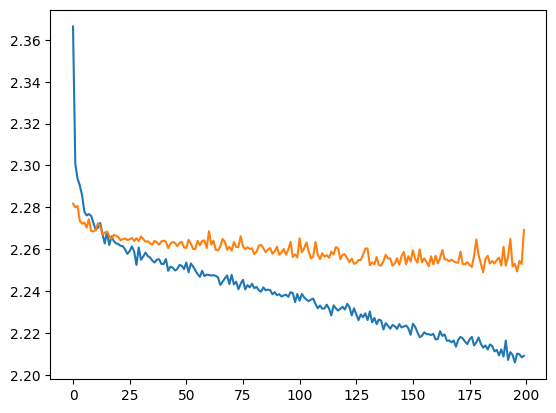

In [281]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

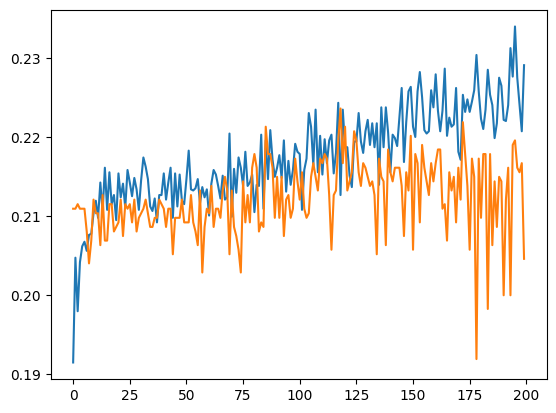

In [282]:
plt.plot(history.history['categorical_accuracy'])
plt.plot(history.history['val_categorical_accuracy'])

In [283]:
# model_conv_tqidf.save("model_conv_tqidf.keras")
loaded_model_conv_tqidf = tf.keras.models.load_model("model_conv_tqidf.keras")

In [284]:
import gc
gc.collect()

4352

In [286]:
from keras.metrics import categorical_accuracy

preds_train = model_conv_tqidf.predict(X_tfidf_net)
c_train = categorical_accuracy(Y_net, preds_train).numpy()
print("Dokładność na zbiorze treningowym wynosi: ", c_train.sum()/c_train.shape[0])

preds_test = model_conv_tqidf.predict(X_tfidf_net_test)
c_test = categorical_accuracy(Y_net_test, preds_test).numpy()
print("Dokładność na zbiorze testowym wynosi: ", c_test.sum()/c_test.shape[0])

217/217 [==============================] - 1s 3ms/step
Dokładność na zbiorze treningowym wynosi:  0.2250720461095101
55/55 [==============================] - 0s 2ms/step
Dokładność na zbiorze testowym wynosi:  0.20461095100864554


Bayes

In [288]:
from sklearn.naive_bayes import MultinomialNB
model_bayes = MultinomialNB().fit(X_tfidf_net, Y)

In [292]:
from keras.metrics import categorical_accuracy

preds_train = model_bayes.predict(X_tfidf_net)
print("Dokładność na zbiorze treningowym wynosi: ", ((preds_train == Y).sum())/Y.shape[0])

preds_test = model_bayes.predict(X_tfidf_net_test)
print("Dokładność na zbiorze testowym wynosi: ", (preds_test == Y_test).sum()/Y_test.shape[0])

Dokładność na zbiorze treningowym wynosi:  0.3845821325648415
Dokładność na zbiorze testowym wynosi:  0.31988472622478387


Prosty RNN

TF-IDF nie bierze pod uwagę kolejności słów, dlatego z reguły nie jest to dobry wybór.

In [63]:
#prosty model rekurencyjny

in1 = tf.keras.layers.Input(shape=(5000, 1))
gru = tf.keras.layers.GRU(128, name='latent_layer')(in1)
bn = tf.keras.layers.BatchNormalization()(gru)
dense = tf.keras.layers.Dense(32, activation="relu")(bn)
drop = tf.keras.layers.Dropout(0.3)(dense)
d1   = tf.keras.layers.Dense(16, activation='softmax')(drop)

model_rnn_tqidf = tf.keras.Model(
	inputs=[in1], 
	outputs=[d1]
)

model_rnn_tqidf.compile(loss="categorical_crossentropy", optimizer="adam", metrics=["categorical_accuracy"])

print(model_rnn_tqidf.summary())

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 5000, 1)]         0         
                                                                 
 latent_layer (GRU)          (None, 128)               50304     
                                                                 
 batch_normalization (BatchN  (None, 128)              512       
 ormalization)                                                   
                                                                 
 dense (Dense)               (None, 32)                4128      
                                                                 
 dropout (Dropout)           (None, 32)                0         
                                                                 
 dense_1 (Dense)             (None, 16)                528       
                                                             

In [64]:
history = model_rnn_tqidf.fit(X_tfidf_net, Y_net, epochs=200, verbose=1, validation_data=(X_tfidf_net_test, Y_net_test))
#niezbyt obiecujące skoki

Epoch 1/200
217/217 [==============================] - 56s 248ms/step - loss: 2.4576 - categorical_accuracy: 0.1991 - val_loss: 2.2940 - val_categorical_accuracy: 0.2110
Epoch 2/200
217/217 [==============================] - 54s 248ms/step - loss: 2.3234 - categorical_accuracy: 0.1986 - val_loss: 4.4338 - val_categorical_accuracy: 0.2110
Epoch 3/200
217/217 [==============================] - 53s 245ms/step - loss: 2.3163 - categorical_accuracy: 0.1951 - val_loss: 9.0759 - val_categorical_accuracy: 0.1695
Epoch 4/200
217/217 [==============================] - 52s 242ms/step - loss: 2.3088 - categorical_accuracy: 0.2037 - val_loss: 22.2717 - val_categorical_accuracy: 0.0236
Epoch 5/200
217/217 [==============================] - 52s 240ms/step - loss: 2.3024 - categorical_accuracy: 0.2030 - val_loss: 25.1438 - val_categorical_accuracy: 0.2110
Epoch 6/200
217/217 [==============================] - 53s 245ms/step - loss: 2.2963 - categorical_accuracy: 0.2086 - val_loss: 48.5746 - val_catego

KeyboardInterrupt: 

### Modelowanie - Embedding (Word2Vec) zamiast TF-IDF + sieć RNN

In [65]:
data_test_w2v = df_test
data_train_w2v = df_train

In [69]:
data_test_w2v.post_cleaned

3669    [[NUMBER], tight, inbreeding, used, identify, ...
2523    [absolutely, feel, home, stage, [PERIOD], prof...
8117    [indeed, [EXCLAMATION_MARK], critical-mass, am...
180     [things, intelligent, persc, chatters, talk, [...
7092    [getting, along, entp, mostly, due, entp, show...
                              ...                        
1383    [[NUMBER], average, female, scientist, also, c...
2374    [separate, rest, world, think, know, [PERIOD],...
4422    [sure, [ELLIPSIS], throw, [NUMBER], cents, [PE...
8335    [[LINK], actually, listening, head, [ELLIPSIS]...
3572    [haha, yes, [EXCLAMATION_MARK], definitely, pr...
Name: post_cleaned, Length: 1735, dtype: object

Tokenizacja

In [71]:
#tokenizer dla czystego i okrojonego tekstu, czysto na potrzeby zamiany postów na sekwencje liczbowe
tokenizer = Tokenizer(num_words=100000)  #okrojone niecałe 10 000 słów
tokenizer.fit_on_texts(data_train_w2v.post_cleaned)  #słownik tworzony na podstawie zbioru treningowego
total_words = len(tokenizer.word_index)
print("Liczba słów:", total_words)

Liczba słów: 108144


In [72]:
#zamiana tekstu na reprezentację liczbową
data_train_w2v['post_tokenized'] = data_train_w2v.apply(lambda x: tokenizer.texts_to_sequences([x.post_cleaned])[0], axis=1)

In [73]:
data_train_w2v[["post_cleaned", "post_tokenized"]].head()

,post_cleaned,post_tokenized
2710,"[care, others, tattoos, would, never, get, tat...","[164, 92, 3977, 12, 36, 14, 3561, 1, 164, 26, ..."
5029,"[momento, mori, [PERIOD], often, make, mistake...","[37877, 27522, 1, 131, 34, 1355, 412, 669, 21,..."
3413,"[thoughts, erik, better, known, phantom, opera...","[263, 15179, 82, 505, 6910, 4196, 43, 155, 841..."
2166,"[said, zero, flexibility, little, time, dating...","[58, 2189, 8073, 77, 16, 473, 1, 45, 69, 16593..."
8288,"[glad, liked, [PERIOD], also, heard, quote, [P...","[485, 486, 1, 28, 377, 582, 1, 6, 39, 330, 93,..."


In [74]:
max_tokens_len = max(data_train_w2v.apply(lambda x: len(x.post_tokenized), axis=1))  #najdłuższy post
max_tokens_len

1081

In [77]:
l = data_train_w2v.apply(lambda x: len(x.post_tokenized), axis=1).tolist()
l.sort()
np.quantile(l, [0, 0.25, 0.5, 0.75, 0.95, 1])

#95 procent próbek ma długość poniżej 945, dlatego padding do maksymalnej długości (1081) wygeneruje wiele zer
#mimo tego warto wypróbować ten prosty schemat

array([   4.  ,  641.  ,  761.  ,  850.  ,  944.05, 1081.  ])

Padding

In [82]:
import tensorflow.keras.utils as ku

#padding
X_w2v = pad_sequences(data_train_w2v.post_tokenized, maxlen = max_tokens_len, padding = 'pre')   #max_tokens_len-1?
#etykiety
Y_w2v = data_train_w2v.class_no
Y_w2v = ku.to_categorical(Y_w2v)

X_w2v.shape, Y_w2v.shape

((6940, 1081), (6940, 16))

In [83]:
data_test_w2v['post_tokenized'] = data_test_w2v.apply(lambda x: tokenizer.texts_to_sequences([x.post_cleaned])[0], axis=1)
X_w2v_test = pad_sequences(data_test_w2v.post_tokenized, maxlen = max_tokens_len, padding = 'pre')

Y_w2v_test = data_test_w2v.class_no

X_w2v_test.shape, Y_w2v_test.shape

((1735, 1081), (1735,))

RNN

In [84]:
#prosty model rekurencyjny

from keras.models import Sequential

model_rnn_w2v = Sequential()
model_rnn_w2v.add(tf.keras.layers.Embedding(input_dim = total_words + 1, output_dim = 64, input_length = max_tokens_len))  #+1, bo numeracja tokenów zaczyna się od 1, a nie od 0
model_rnn_w2v.add(tf.keras.layers.GRU(512, name='latent_layer'))
model_rnn_w2v.add(tf.keras.layers.BatchNormalization())
model_rnn_w2v.add(tf.keras.layers.Dense(128, activation="relu"))
model_rnn_w2v.add(tf.keras.layers.Dropout(0.3))
model_rnn_w2v.add(tf.keras.layers.Dense(16, activation='softmax'))

# model5 = tf.keras.Model(
# 	inputs=[emb], 
# 	outputs=[d1]
# )

model_rnn_w2v.compile(loss="categorical_crossentropy", optimizer="adam", metrics=[tf.keras.metrics.CategoricalAccuracy()])

print(model_rnn_w2v.summary())

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_2 (Embedding)     (None, 1081, 64)          6921280   
                                                                 
 latent_layer (GRU)          (None, 512)               887808    
                                                                 
 batch_normalization_3 (Batc  (None, 512)              2048      
 hNormalization)                                                 
                                                                 
 dense_6 (Dense)             (None, 128)               65664     
                                                                 
 dropout_3 (Dropout)         (None, 128)               0         
                                                                 
 dense_7 (Dense)             (None, 16)                2064      
                                                      

In [85]:
history = model_rnn_w2v.fit(X_w2v, Y_w2v, epochs=100, verbose=2, validation_data=(X_w2v_test, ku.to_categorical(Y_w2v_test)))

Epoch 1/100


217/217 - 26s - loss: 2.3968 - categorical_accuracy: 0.1780 - val_loss: 2.3268 - val_categorical_accuracy: 0.1695 - 26s/epoch - 121ms/step
Epoch 2/100
217/217 - 25s - loss: 1.9193 - categorical_accuracy: 0.3754 - val_loss: 3.6437 - val_categorical_accuracy: 0.2110 - 25s/epoch - 113ms/step
Epoch 3/100
217/217 - 25s - loss: 0.9750 - categorical_accuracy: 0.6978 - val_loss: 14.1398 - val_categorical_accuracy: 0.1764 - 25s/epoch - 113ms/step
Epoch 4/100
217/217 - 25s - loss: 0.3117 - categorical_accuracy: 0.9088 - val_loss: 32.6715 - val_categorical_accuracy: 0.2501 - 25s/epoch - 113ms/step
Epoch 5/100
217/217 - 25s - loss: 0.1288 - categorical_accuracy: 0.9601 - val_loss: 26.2240 - val_categorical_accuracy: 0.0790 - 25s/epoch - 114ms/step
Epoch 6/100
217/217 - 24s - loss: 0.0684 - categorical_accuracy: 0.9805 - val_loss: 13.4188 - val_categorical_accuracy: 0.0767 - 24s/epoch - 113ms/step
Epoch 7/100
217/217 - 25s - loss: 0.0396 - categorical_accuracy: 0.9883 - val_loss: 19.8998 - val_cate

Ewaluacja

In [92]:
#czy to możliwe, że model się zaczyna przeuczać też zbioru walidacyjnego?

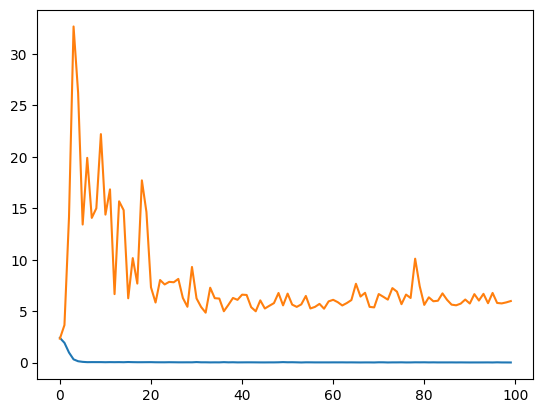

In [86]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

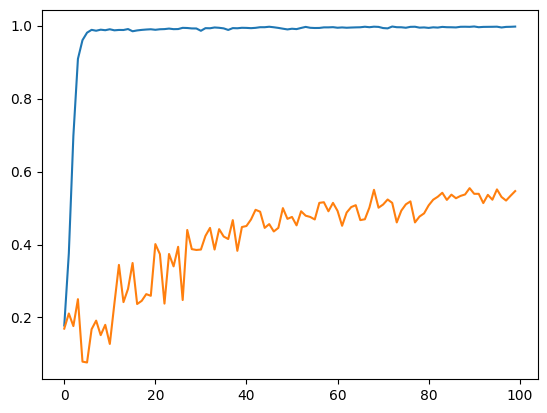

In [87]:
plt.plot(history.history['categorical_accuracy'])
plt.plot(history.history['val_categorical_accuracy'])

In [88]:
# model_rnn_w2v.save("model_rnn_w2v.keras")
loaded_model_rnn_w2v = tf.keras.models.load_model("model_rnn_w2v.keras")

In [89]:
import gc
gc.collect()

10505

In [90]:
from keras.metrics import categorical_accuracy

preds_train = loaded_model_rnn_w2v.predict(X_w2v)
c_train = categorical_accuracy(Y_w2v, preds_train).numpy()
print("Dokładność na zbiorze treningowym wynosi: ", c_train.sum()/c_train.shape[0])

preds_test = loaded_model_rnn_w2v.predict(X_w2v_test)
c_test = categorical_accuracy(ku.to_categorical(Y_w2v_test), preds_test).numpy()
print("Dokładność na zbiorze testowym wynosi: ", c_test.sum()/c_test.shape[0])

217/217 [==============================] - 11s 46ms/step
Dokładność na zbiorze treningowym wynosi:  0.9997118155619596
55/55 [==============================] - 2s 43ms/step
Dokładność na zbiorze testowym wynosi:  0.5463976945244957


In [91]:
pd.DataFrame(np.argmax(preds_train, axis = 1)).groupby(0).size()

0
0     1176
1      548
2     1042
3      873
4      185
5      152
6     1466
7      540
8      217
9      270
10     134
11     164
12      71
13      38
14      31
15      33
dtype: int64

In [93]:
pd.DataFrame(np.argmax(preds_test, axis = 1)).groupby(0).size()

0
0     347
1     207
2     193
3     186
4      25
5      59
6     449
7     115
8       8
9      44
10     63
11     14
12      2
13      9
14      6
15      8
dtype: int64

In [ ]:
#poszerzenie datasetu